In [ ]:
import torch
from diffusers import FluxPipeline

pipe = FluxPipeline.from_pretrained("black-forest-labs/FLUX.1-schnell", torch_dtype=torch.bfloat16)
pipe.enable_model_cpu_offload() #save some VRAM by offloading the model to CPU. Remove this if you have enough GPU power

prompt = "A cat holding a sign that says hello world"
image = pipe(
    prompt,
    guidance_scale=0.0,
    num_inference_steps=4,
    max_sequence_length=256,
    generator=torch.Generator("cpu").manual_seed(0)
).images[0]
# image.save("flux-schnell.png")
image

In [1]:
from concept_attention import ConceptAttentionFluxPipeline

pipeline = ConceptAttentionFluxPipeline(
    model_name="flux-schnell",
    device="cuda:0"
)

# prompt = "A dragon standing on a rock. "
# concepts = ["dragon", "rock", "sky", "cloud"]

# pipeline_output = pipeline.generate_image(
#     prompt=prompt,
#     concepts=concepts,
#     width=1024,
#     height=1024,
# )

# image = pipeline_output.image
# concept_heatmaps = pipeline_output.concept_heatmaps

# image.save("image.png")
# for concept, concept_heatmap in zip(concepts, concept_heatmaps):
#     concept_heatmap.save(f"{concept}.png")

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
`torch_dtype` is deprecated! Use `dtype` instead!
`torch_dtype` is deprecated! Use `dtype` instead!


Init model
Loading checkpoint
Loading checkpoint
Init AE
Init AE


# How Concept Heatmaps are Generated

The concept heatmaps you see are computed from **attention output vectors** (not raw attention weights). Here's the complete pipeline:

## 1. Attention Vectors Collection (per transformer layer)

During denoising, the modified Flux transformer collects vectors from each **DoubleStreamBlock** layer:

### Output Space Vectors (Main heatmaps):
- **`output_space_image_vectors`**: The output of the self/cross-attention for **image patches** (after attention is applied)
  - Shape: `(batch, patches, hidden_dim)`
  - These are `img_attn` vectors from line 173 in `modified_double_stream_block.py`
  
- **`output_space_concept_vectors`**: The output of the concept-image joint attention for **concepts**
  - Shape: `(batch, concepts, hidden_dim)`
  - These are `concept_attn` vectors from line 186 in `modified_double_stream_block.py`

### Cross-Attention Vectors (Alternative visualization):
- **`cross_attention_image_vectors`**: Query vectors for image patches (before attention)
  - These are `img_q` from line 189
  
- **`cross_attention_concept_vectors`**: Query vectors for concepts (before attention)
  - These are `concept_q` from line 188

## 2. Heatmap Computation

From `concept_attention_pipeline.py` line 148-152:

```python
concept_heatmaps = compute_heatmaps_from_vectors(
    concept_attention_dict["output_space_image_vectors"],  # Image patch outputs
    concept_attention_dict["output_space_concept_vectors"], # Concept outputs
    layer_indices=layer_indices,  # Default: [15, 16, 17, 18]
    timesteps=timesteps,          # Default: [0, 1, 2, 3]
    softmax=True
)
```

### The computation (line 55-65):
1. **Dot product** between image vectors and concept vectors:
   ```python
   heatmaps = einsum(image_vectors, concept_vectors,
                     "time layers batch patches dim, time layers batch concepts dim 
                     -> time layers batch concepts patches")
   ```
   
2. **Softmax** across concepts (so each pixel shows which concept it belongs to most)

3. **Filter** to specific timesteps (default: all 4) and layers (default: last 4 layers, 15-18)

4. **Average** across timesteps and layers

5. **Reshape** to 64x64 spatial grid

## 3. Key Parameters You Can Control

When calling `pipeline.generate_image()`:

- **`layer_indices`**: Which transformer layers to use (default: `[15, 16, 17, 18]` - the last 4 of 19 total)
  - Earlier layers (0-10): More abstract features
  - Later layers (15-18): More semantic/object-level features
  
- **`timesteps`**: Which denoising steps to average over (default: all steps)
  - Earlier timesteps: Noisier, more abstract
  - Later timesteps: Cleaner, more refined

- **`softmax`**: Whether to normalize across concepts (default: True)

## 4. What the Heatmaps Show

Each concept heatmap shows:
- **High values (bright)**: Where that concept is most strongly represented in the output space
- **Low values (dark)**: Where that concept is less present

The heatmaps are based on the **semantic similarity** between:
- The representation of each image patch (after attention)
- The representation of each concept (after attending to the image)

This is more robust than raw attention weights because it captures the final output representations after the attention mechanism has processed the information.

In [1]:
from concept_attention import ConceptAttentionFluxPipeline

pipeline = ConceptAttentionFluxPipeline(
    model_name="flux-schnell",
    device="cuda:0"
)



You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
`torch_dtype` is deprecated! Use `dtype` instead!


Init model
Loading checkpoint
Init AE


In [5]:
prompt = "A person holding a glass"
concepts = ["person","holding","glass"]

pipeline_output = pipeline.generate_image(
    prompt=prompt,
    concepts=concepts,
    width=1024,
    height=1024,
)
    

image = pipeline_output.image
concept_heatmaps = pipeline_output.concept_heatmaps
    # # cross_attention_maps=

image.save("image.png")
for concept, concept_heatmap in zip(concepts, concept_heatmaps):
    concept_heatmap.save(f"{concept}.png")

Generating 'A person holding a glass' with seed 0


4it [00:03,  1.21it/s]



Done in 18.3s.


# Getting Saliency Matrices for Training

Below are examples of how to extract numeric saliency matrices (not just PNG images) for classifier training, plus the exact conversion code to verify the process.

In [7]:
# Method 1: Get numeric matrices from pipeline (easiest)
# Set return_pil_heatmaps=False to get numpy arrays instead of PIL images

import os
os.makedirs("results", exist_ok=True)

prompt = "a photo of tree trunk on sidewalk on a plain background"
concepts = ["tree trunk", "on", "sidewalk"]

pipeline_output = pipeline.generate_image(
    prompt=prompt,
    concepts=concepts,
    width=1024,
    height=1024,
    return_pil_heatmaps=False,  # Get numeric arrays instead of PIL images
    softmax=True,  # Set False if you want raw similarity scores
    layer_indices=list(range(12, 19)),  # Last 4 layers
    timesteps=list(range(4)),  # All 4 timesteps
)

# concept_heatmaps is now a numpy array
saliency_matrices = pipeline_output.concept_heatmaps  # Shape: (num_concepts, 64, 64)
cross_attention_matrices = pipeline_output.cross_attention_maps  # Shape: (num_concepts, 64, 64)

print(f"Saliency matrices shape: {saliency_matrices.shape}")
print(f"Data type: {saliency_matrices.dtype}")
print(f"Value range: [{saliency_matrices.min():.4f}, {saliency_matrices.max():.4f}]")

# Save for training
import numpy as np
np.save("results/saliency_matrices.npy", saliency_matrices)
print(f"\nSaved saliency matrices to results/saliency_matrices.npy")

# Also save as torch tensor if you prefer
import torch
torch.save(torch.from_numpy(saliency_matrices), "results/saliency_matrices.pt")
print(f"Saved as PyTorch tensor to results/saliency_matrices.pt")

Generating 'a photo of tree trunk on sidewalk on a plain background' with seed 0


4it [00:03,  1.21it/s]


Done in 19.1s.
Saliency matrices shape: (3, 64, 64)
Data type: float32
Value range: [0.0000, 1.0000]

Saved saliency matrices to results/saliency_matrices.npy
Saved as PyTorch tensor to results/saliency_matrices.pt


In [ ]:
# Method 2: Manual conversion - Extract raw vectors and compute heatmaps yourself
# This gives you full control over the process and lets you verify the pipeline's computation

import torch
import einops

prompt = "a photo of tree trunk on sidewalk on a plain background"
concepts = ["tree trunk", "on", "sidewalk"]

# Get raw attention vectors from the generator
image, concept_attention_dict = pipeline.flux_generator.generate_image(
    width=1024,
    height=1024,
    prompt=prompt,
    num_steps=4,
    concepts=concepts,
    seed=0,
    guidance=0.0,
)

# Extract the vectors
img_vecs = concept_attention_dict["output_space_image_vectors"]     # (time, layers, batch, patches, dim)
concept_vecs = concept_attention_dict["output_space_concept_vectors"]  # (time, layers, batch, concepts, dim)

print(f"Image vectors shape: {img_vecs.shape}")
print(f"Concept vectors shape: {concept_vecs.shape}")

# === EXACT CONVERSION CODE FROM PIPELINE ===
# This is what compute_heatmaps_from_vectors() does internally

# Step 1: Compute dot product (similarity) between image patches and concepts
# Result shape: (time, layers, batch, concepts, patches)
heatmaps = einops.einsum(
    img_vecs, 
    concept_vecs,
    "time layers batch patches dim, time layers batch concepts dim -> time layers batch concepts patches",
)
print(f"\nAfter dot product: {heatmaps.shape}")

# Step 2: Apply softmax across concepts (so each pixel "votes" for one concept)
heatmaps = torch.nn.functional.softmax(heatmaps, dim=-2)  # dim=-2 is the concepts dimension
print(f"After softmax: {heatmaps.shape}")

# Step 3: Filter to specific timesteps and layers
timesteps = list(range(4))  # Use all 4 timesteps
layer_indices = list(range(15, 19))  # Use last 4 layers
heatmaps_filtered = heatmaps[timesteps][:, layer_indices]
print(f"After filtering timesteps/layers: {heatmaps_filtered.shape}")

# Step 4: Average across timesteps and layers
heatmaps_avg = einops.reduce(
    heatmaps_filtered,
    "time layers batch concepts patches -> batch concepts patches",
    reduction="mean"
)
print(f"After averaging: {heatmaps_avg.shape}")

# Step 5: Reshape patches (4096 = 64*64) to spatial grid
heatmaps_spatial = einops.rearrange(
    heatmaps_avg,
    "batch concepts (h w) -> batch concepts h w",
    h=64,
    w=64
)
print(f"After reshaping to spatial: {heatmaps_spatial.shape}")

# Extract for batch=0 (typically only one batch)
saliency_manual = heatmaps_spatial[0].cpu().float().numpy()
print(f"\nFinal saliency shape: {saliency_manual.shape}")  # (concepts, 64, 64)
print(f"Value range: [{saliency_manual.min():.4f}, {saliency_manual.max():.4f}]")

# Save the manually computed version
np.save("results/saliency_manual.npy", saliency_manual)

In [ ]:
# Verification: Compare pipeline output with manual computation

# Load both versions
saliency_pipeline = np.load("results/saliency_matrices.npy")
saliency_manual = np.load("results/saliency_manual.npy")

print("Pipeline shape:", saliency_pipeline.shape)
print("Manual shape:", saliency_manual.shape)

# Check if they match (they should be identical or very close)
difference = np.abs(saliency_pipeline - saliency_manual)
max_diff = difference.max()
mean_diff = difference.mean()

print(f"\nVerification:")
print(f"  Max difference: {max_diff:.2e}")
print(f"  Mean difference: {mean_diff:.2e}")
print(f"  Match: {'✓ YES' if max_diff < 1e-4 else '✗ NO'}")

# Visualize one concept to verify
import matplotlib.pyplot as plt

concept_idx = 0
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].imshow(saliency_pipeline[concept_idx], cmap='plasma')
axes[0].set_title(f'Pipeline: {concepts[concept_idx]}')
axes[0].axis('off')

axes[1].imshow(saliency_manual[concept_idx], cmap='plasma')
axes[1].set_title(f'Manual: {concepts[concept_idx]}')
axes[1].axis('off')

axes[2].imshow(difference[concept_idx], cmap='RdYlGn_r')
axes[2].set_title(f'Difference (max={difference[concept_idx].max():.2e})')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('results/verification.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nSaved verification plot to results/verification.png")

In [ ]:
# Optional: Get per-timestep and per-layer saliency matrices
# Useful if you want to train on temporal/hierarchical features

# Using the vectors from Method 2 above
# heatmaps_spatial has shape: (batch, concepts, h, w) where batch includes all (time, layers)

# Let's get the full per-timestep, per-layer version
heatmaps_full = einops.rearrange(
    heatmaps,  # Original: (time, layers, batch, concepts, patches)
    "time layers batch concepts (h w) -> time layers batch concepts h w",
    h=64, w=64
)

print(f"Full heatmap shape: {heatmaps_full.shape}")  # (4, 19, 1, 3, 64, 64)
print(f"  - 4 timesteps")
print(f"  - 19 transformer layers")
print(f"  - 1 batch")
print(f"  - {len(concepts)} concepts")
print(f"  - 64x64 spatial resolution")

# Save the full version (includes all timesteps and layers)
heatmaps_full_np = heatmaps_full.cpu().float().numpy()
np.save("results/saliency_full_per_timestep_layer.npy", heatmaps_full_np)
print(f"\nSaved full per-timestep/layer matrices to results/saliency_full_per_timestep_layer.npy")
print(f"Size: {heatmaps_full_np.nbytes / 1024**2:.2f} MB")

# Example: Access specific timestep and layer
timestep_idx = 3  # Last timestep
layer_idx = 18    # Last layer
concept_idx = 0   # First concept

specific_map = heatmaps_full_np[timestep_idx, layer_idx, 0, concept_idx]
print(f"\nExample: Heatmap for '{concepts[concept_idx]}' at timestep {timestep_idx}, layer {layer_idx}")
print(f"  Shape: {specific_map.shape}")
print(f"  Value range: [{specific_map.min():.4f}, {specific_map.max():.4f}]")

## Summary: What You Have Now

**For classifier training, you have 3 options:**

1. **Averaged saliency matrices** (`results/saliency_matrices.npy`):
   - Shape: `(num_concepts, 64, 64)`
   - Already averaged across timesteps and layers
   - Use this if you want one representative heatmap per concept
   - Smallest file size

2. **Manually computed** (`results/saliency_manual.npy`):
   - Same as option 1, but computed step-by-step
   - Use for verification or if you need to modify the computation

3. **Full per-timestep/layer** (`results/saliency_full_per_timestep_layer.npy`):
   - Shape: `(4 timesteps, 19 layers, 1 batch, num_concepts, 64, 64)`
   - Keeps all temporal and hierarchical information
   - Use if you want to train on dynamics or layer-specific features
   - Largest file size (~100MB for this example)

**Key parameters to control:**
- `softmax=True/False`: Normalize across concepts or use raw similarity scores
- `layer_indices`: Which layers to average (default: last 4)
- `timesteps`: Which denoising steps to average (default: all)

**Next steps for training:**
- Load the saved `.npy` files with `np.load()`
- Normalize/standardize across your dataset
- Use as input features or labels for your classifier

In [8]:
arr=np.load("results/saliency_matrices.npy")
print(arr.shape)
arr

(3, 64, 64)


array([[[3.56445312e-02, 1.06933594e-01, 4.29687500e-01, ...,
         4.47265625e-01, 4.27734375e-01, 7.95898438e-02],
        [5.34667969e-02, 1.06933594e-01, 3.26171875e-01, ...,
         4.70703125e-01, 3.75000000e-01, 4.47265625e-01],
        [8.93554688e-02, 1.06933594e-01, 3.92578125e-01, ...,
         4.41406250e-01, 6.01562500e-01, 3.92578125e-01],
        ...,
        [3.56445312e-02, 2.05636024e-06, 3.63769531e-02, ...,
         5.35156250e-01, 2.85156250e-01, 4.10156250e-01],
        [7.12890625e-02, 1.06933594e-01, 5.34667969e-02, ...,
         3.92578125e-01, 1.42578125e-01, 2.13867188e-01],
        [1.07910156e-01, 4.93164062e-02, 1.10839844e-01, ...,
         2.36328125e-01, 2.50000000e-01, 2.85156250e-01]],

       [[1.77734375e-01, 1.42578125e-01, 1.43554688e-01, ...,
         8.93554688e-02, 7.22656250e-02, 5.85937500e-01],
        [1.61132812e-01, 1.42578125e-01, 9.32617188e-02, ...,
         7.12890625e-02, 3.75000000e-01, 1.42578125e-01],
        [1.25000000e-01, 

In [9]:
arr.max(),arr.min()

(np.float32(1.0), np.float32(1.83671e-40))

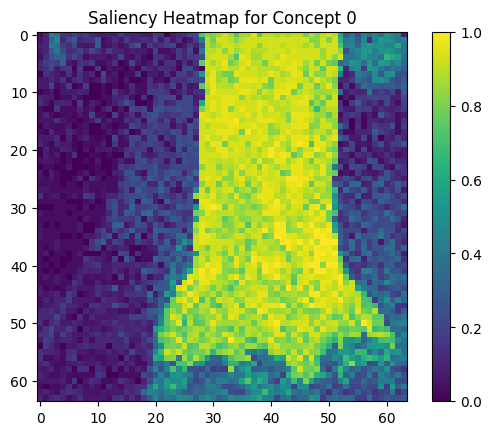

In [13]:
#convert to heatmap
import matplotlib.pyplot as plt
plt.imshow(arr[0])
plt.colorbar()
plt.title("Saliency Heatmap for Concept 0")
# plt.savefig("results/saliency_heatmap_concept_0.png", dpi=150, bbox_inches='tight')
plt.show()  

In [16]:
#read /home/namanb/SBILab/CSE677/Project/ConceptAttention/data/relationships.json/relationships.json
import json
with open("/home/namanb/SBILab/CSE677/Project/ConceptAttention/data/relationships.json/relationships.json", "r") as f:
    relationships = json.load(f)

# print(relationships.keys())

AttributeError: 'list' object has no attribute 'keys'

In [17]:
relationships

[{'relationships': [{'predicate': 'ON',
    'object': {'h': 290,
     'object_id': 1058534,
     'merged_object_ids': [5046],
     'synsets': ['sidewalk.n.01'],
     'w': 722,
     'y': 308,
     'x': 78,
     'names': ['sidewalk']},
    'relationship_id': 15927,
    'synsets': ['along.r.01'],
    'subject': {'name': 'shade',
     'h': 192,
     'synsets': ['shade.n.01'],
     'object_id': 5045,
     'w': 274,
     'y': 338,
     'x': 119}},
   {'predicate': 'wears',
    'object': {'h': 28,
     'object_id': 1058525,
     'merged_object_ids': [5048],
     'synsets': ['shoe.n.01'],
     'w': 48,
     'y': 485,
     'x': 388,
     'names': ['shoes']},
    'relationship_id': 15928,
    'synsets': ['wear.v.01'],
    'subject': {'name': 'man',
     'h': 262,
     'synsets': ['man.n.01'],
     'object_id': 1058529,
     'w': 60,
     'y': 249,
     'x': 238}},
   {'predicate': 'has',
    'object': {'name': 'headlight',
     'h': 15,
     'synsets': ['headlight.n.01'],
     'object_id': 5050,